In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

import logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)
logging.disable(logging.WARNING)

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

E0000 00:00:1778344518.151515    8212 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1778344518.159122    8212 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1778344518.178094    8212 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778344518.178114    8212 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778344518.178117    8212 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778344518.178119    8212 computation_placer.cc:177] computation placer already registered. Please check linka

In [2]:
import random
import numpy as np
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import cv2
from matplotlib.gridspec import GridSpec

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import EfficientNetV2B2
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.utils import Sequence

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, confusion_matrix,
    classification_report, ConfusionMatrixDisplay, roc_auc_score, roc_curve, auc,
    precision_recall_curve, matthews_corrcoef, cohen_kappa_score,
    balanced_accuracy_score, log_loss, hamming_loss, zero_one_loss,
    jaccard_score, multilabel_confusion_matrix
)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import average_precision_score

import gradio as gr
%matplotlib inline

In [3]:
os.environ['PYTHONHASHSEED'] = '0'
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
os.environ['TF_CUDNN_CONVOLUTION_BWD_FILTER'] = 'deterministic'
os.environ['TF_CUDNN_CONVOLUTION_FWD'] = 'deterministic'

random.seed(42)


np.random.seed(42)

tf.random.set_seed(42)

tf.config.experimental.enable_op_determinism()

tf.keras.utils.set_random_seed(42)

!rm -rf /kaggle/working/*

In [4]:
DATA_ROOT = "/kaggle/input/datasets/evilspirit05/ecg-analysis/ecg_data"
IMAGE_SIZE = 224
BATCH_SIZE = 32
LEARNING_RATE = 1e-3
LEARNING_RATE_STAGE2=2e-5
EPOCHS_STAGE1 = 100
EPOCHS_STAGE2 = 200
DROPOUT_RATE = 0.2

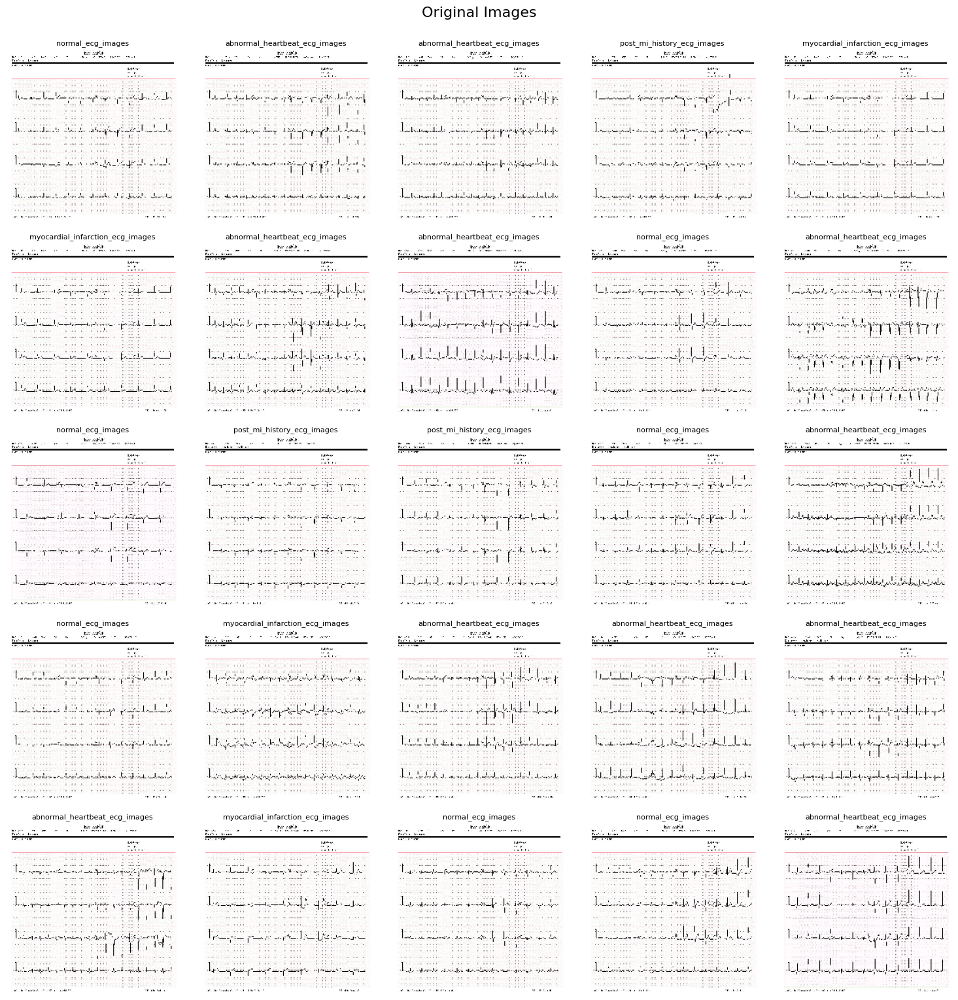

In [5]:
plt.figure(figsize=(15, 15))

all_image_paths = []
all_labels = []

for class_name in sorted(os.listdir(DATA_ROOT)):
    class_path = os.path.join(DATA_ROOT, class_name)
    if os.path.isdir(class_path):
        image_files = [f for f in os.listdir(class_path) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
        for img_file in image_files:
            all_image_paths.append(os.path.join(class_path, img_file))
            all_labels.append(class_name)

random.seed(42)
indices = random.sample(range(len(all_image_paths)), min(25, len(all_image_paths)))

for i, idx in enumerate(indices):
    img_path = all_image_paths[idx]
    class_name = all_labels[idx]
    
    img = load_img(img_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
    img_array = img_to_array(img).astype('uint8')
    
    plt.subplot(5, 5, i + 1)
    plt.imshow(img_array.astype('uint8'))
    plt.title(f'{class_name}', fontsize=8, pad=3)
    plt.axis('off')

plt.tight_layout(pad=1.5)
plt.suptitle('Original Images', fontsize=16, y=1.02)
plt.show()

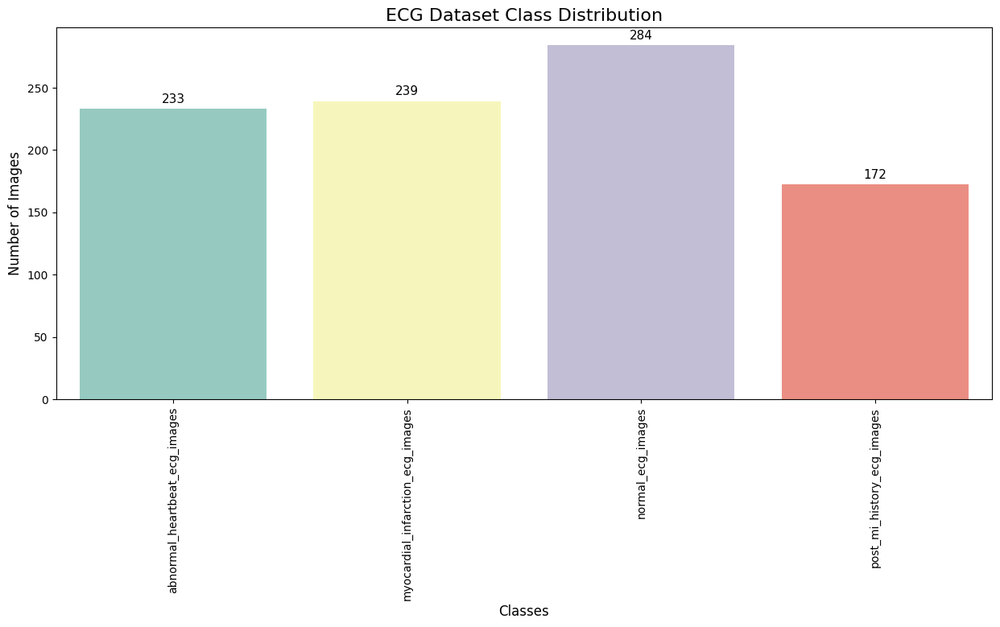

In [6]:
class_counts = {}

for class_name in os.listdir(DATA_ROOT):
    class_path = os.path.join(DATA_ROOT, class_name)

    if os.path.isdir(class_path):
        class_counts[class_name] = len(os.listdir(class_path))

df = pd.DataFrame({"Class": class_counts.keys(),"Count": class_counts.values()})

plt.figure(figsize=(15, 6))

sns.barplot(data=df,x="Class",y="Count",palette="Set3")

plt.title("ECG Dataset Class Distribution", fontsize=16)
plt.xlabel("Classes", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.xticks(rotation=90)

for index, value in enumerate(df["Count"]):
    plt.text(index, value + 5, str(value), ha='center', fontsize=11)

plt.show()

In [7]:
all_data = []
for class_name in os.listdir(DATA_ROOT):
    class_path = os.path.join(DATA_ROOT, class_name)
    for img in os.listdir(class_path):
        all_data.append((os.path.join(class_path, img), class_name))


train_data, temp_data = train_test_split(
    all_data,
    test_size=0.30,
    random_state=42,
    stratify=[label for _, label in all_data]
)


val_data, test_data = train_test_split(
    temp_data,
    test_size=0.5,
    random_state=42,
    stratify=[label for _, label in temp_data]
)

In [8]:
class_names = sorted(os.listdir(DATA_ROOT))
NUM_CLASSES = len(class_names)
class_to_index = {name: i for i, name in enumerate(class_names)}
print(f"Training samples: {len(train_data)}")
print(f"Validation samples: {len(val_data)}")
print(f"Test samples: {len(test_data)}")
print(f"Classes: {class_to_index}")

Training samples: 649
Validation samples: 139
Test samples: 140
Classes: {'abnormal_heartbeat_ecg_images': 0, 'myocardial_infarction_ecg_images': 1, 'normal_ecg_images': 2, 'post_mi_history_ecg_images': 3}


In [9]:
class CustomDataGen(Sequence):
    def __init__(self, data, batch_size, img_size, class_to_index, num_classes, shuffle=True, **kwargs):
        super().__init__(**kwargs)
        self.data = data
        self.batch_size = batch_size
        self.img_size = img_size
        self.class_to_index = class_to_index
        self.num_classes = num_classes
        self.shuffle = shuffle
        self.indexes = np.arange(len(data))
        self.on_epoch_end()

    def __len__(self):
        return len(self.data) // self.batch_size

    def __getitem__(self, index):
        batch_indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        images = []
        labels = []

        for i in batch_indexes:
            img_path, label = self.data[i]
            
            img = cv2.imread(img_path)
            img = cv2.resize(img, (self.img_size, self.img_size))
            img = img / 255.0

            images.append(img)
            labels.append(self.class_to_index[label])

        return np.array(images), np.array(labels)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)



train_generator = CustomDataGen(
    train_data,
    BATCH_SIZE,
    IMAGE_SIZE,
    class_to_index,
    NUM_CLASSES,
    shuffle=True
)

valid_generator = CustomDataGen(
    val_data,
    BATCH_SIZE,
    IMAGE_SIZE,
    class_to_index,
    NUM_CLASSES,
    shuffle=False
)

test_generator = CustomDataGen(
    test_data,
    BATCH_SIZE,
    IMAGE_SIZE,
    class_to_index,
    NUM_CLASSES,
    shuffle=False
)

In [10]:
images, labels = next(iter(train_generator))

print("Image batch shape:", images.shape)
print("Label batch shape:", labels.shape)

Image batch shape: (32, 224, 224, 3)
Label batch shape: (32,)


In [11]:
base_model = EfficientNetV2B2(weights='imagenet',include_top=False,input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),include_preprocessing=False)

base_model.trainable = False

inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

x = base_model(inputs, training=False)

x = GlobalAveragePooling2D()(x)

x = Dropout(DROPOUT_RATE)(x)

x = Dense(256, activation='relu')(x)
x = Dropout(DROPOUT_RATE)(x)

x = Dense(128, activation='relu')(x)
x = Dropout(DROPOUT_RATE)(x)

outputs = Dense(NUM_CLASSES, activation='softmax')(x)

model = Model(inputs, outputs)

model.compile(optimizer=Adam(learning_rate=LEARNING_RATE),loss=tf.keras.losses.SparseCategoricalCrossentropy(),metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b2 (Functional)  │ (None, 7, 7, 1408)     │     8,769,374 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1408)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1408)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       360,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,163,490 (34.96 MB)

 Trainable params: 394,116 (1.50 MB)

 Non-trainable params: 8,769,374 (33.45 MB)

In [12]:
steps_epochs = len(train_data) // BATCH_SIZE
val_steps = len(val_data) // BATCH_SIZE

callbacks = [EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7, verbose=1),
    ModelCheckpoint('best_model_efficientnetv2_stage1.keras', monitor='val_accuracy', save_best_only=True, verbose=1)]

history_phase1 = model.fit(train_generator,validation_data=valid_generator,epochs=EPOCHS_STAGE1, steps_per_epoch=steps_epochs,validation_steps=val_steps,callbacks=callbacks,verbose=1)

Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3011 - loss: 1.4038
Epoch 1: val_accuracy improved from -inf to 0.45312, saving model to best_model_efficientnetv2_stage1.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.3021 - loss: 1.4029 - val_accuracy: 0.4531 - val_loss: 1.2535 - learning_rate: 0.0010
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3475 - loss: 1.3399
Epoch 2: val_accuracy did not improve from 0.45312
20/20 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.3485 - loss: 1.3392 - val_accuracy: 0.4297 - val_loss: 1.2041 - learning_rate: 0.0010
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4304 - loss: 1.2684
Epoch 3: val_accuracy improved from 0.45312 to 0.49219, saving model to best_model_efficientnetv2_stage1.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.4310 - loss: 1.2673 - val_accuracy: 0.4922 - val_loss: 1.1971 - learning_rate: 0.0010
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy:

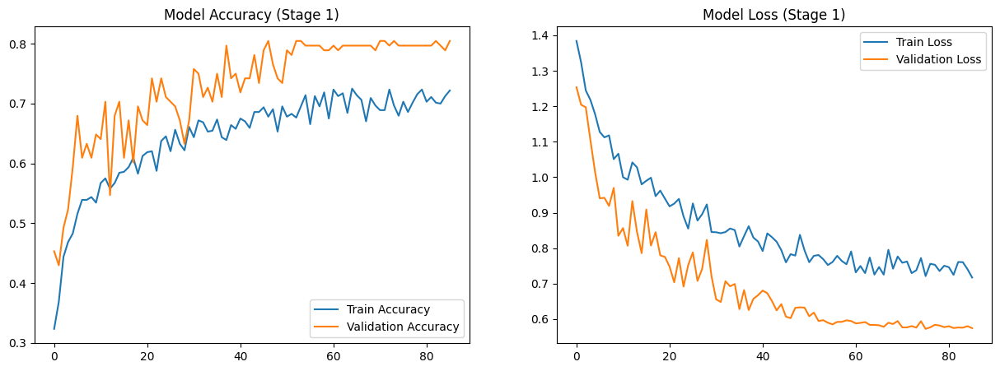

In [13]:
acc = history_phase1.history['accuracy']
val_acc = history_phase1.history['val_accuracy']
loss = history_phase1.history['loss']
val_loss = history_phase1.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(15, 5))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Model Accuracy (Stage 1)')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.title('Model Loss (Stage 1)')
plt.legend()

plt.show()

In [14]:
base_model.trainable = True

for layer in base_model.layers[:-100]:
    layer.trainable = False


lr_schedule2 = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=LEARNING_RATE_STAGE2,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True
)

model.compile(optimizer=Adam(learning_rate=LEARNING_RATE_STAGE2),loss=tf.keras.losses.SparseCategoricalCrossentropy(),metrics=['accuracy'])


callbacks = [EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7, verbose=1),
    ModelCheckpoint('best_model_efficientnetv2_stage2.keras', monitor='val_accuracy', save_best_only=True, verbose=1)]

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b2 (Functional)  │ (None, 7, 7, 1408)     │     8,769,374 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1408)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1408)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       360,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,163,490 (34.96 MB)

 Trainable params: 5,082,288 (19.39 MB)

 Non-trainable params: 4,081,202 (15.57 MB)

In [15]:
history_phase2 = model.fit(train_generator,validation_data=valid_generator,epochs=EPOCHS_STAGE2,callbacks=callbacks,verbose=1,steps_per_epoch=steps_epochs,validation_steps=val_steps)

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4497 - loss: 1.2000
Epoch 1: val_accuracy improved from -inf to 0.61719, saving model to best_model_efficientnetv2_stage2.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 79s 3s/step - accuracy: 0.4513 - loss: 1.1994 - val_accuracy: 0.6172 - val_loss: 0.9731 - learning_rate: 2.0000e-05
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5090 - loss: 1.1105
Epoch 2: val_accuracy improved from 0.61719 to 0.68750, saving model to best_model_efficientnetv2_stage2.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step - accuracy: 0.5093 - loss: 1.1107 - val_accuracy: 0.6875 - val_loss: 0.8270 - learning_rate: 2.0000e-05
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5469 - loss: 1.0012
Epoch 3: val_accuracy improved from 0.68750 to 0.71094, saving model to best_model_efficientnetv2_stage2.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 53s 3s/step - accuracy: 0.5458 - loss: 1.0032 - val_accuracy: 0.7109 - val_loss: 0.7327 - learning_rate: 

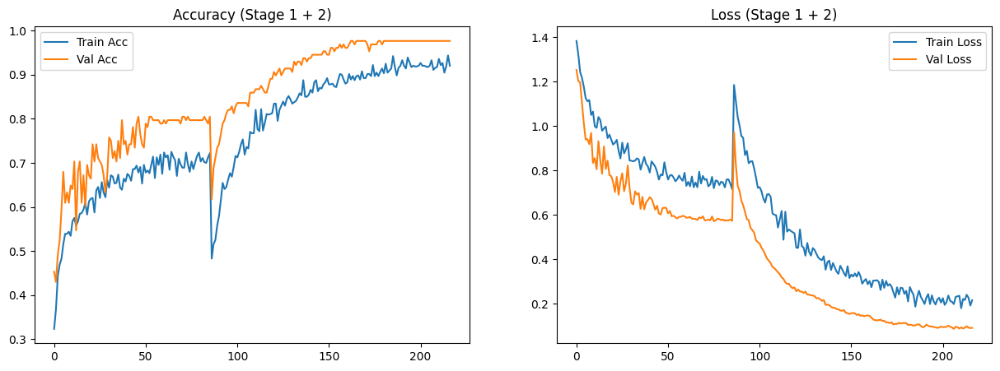

In [16]:
acc += history_phase2.history['accuracy']
val_acc += history_phase2.history['val_accuracy']
loss += history_phase2.history['loss']
val_loss += history_phase2.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(epochs_range, acc, label='Train Acc')
plt.plot(epochs_range, val_acc, label='Val Acc')
plt.title('Accuracy (Stage 1 + 2)')
plt.legend()

plt.subplot(1,2,2)
plt.plot(epochs_range, loss, label='Train Loss')
plt.plot(epochs_range, val_loss, label='Val Loss')
plt.title('Loss (Stage 1 + 2)')
plt.legend()

plt.show()

In [17]:
model_path = "/kaggle/working/best_model_efficientnetv2_stage2.keras"
model = load_model(model_path)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b2 (Functional)  │ (None, 7, 7, 1408)     │     8,769,374 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1408)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1408)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       360,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,328,068 (73.73 MB)

 Trainable params: 5,082,288 (19.39 MB)

 Non-trainable params: 4,081,202 (15.57 MB)

 Optimizer params: 10,164,578 (38.77 MB)

In [18]:
test_loss, test_acc = model.evaluate(test_generator, verbose=1)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

4/4 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.9740 - loss: 0.1161
Test Loss: 0.1677
Test Accuracy: 0.9531


4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step


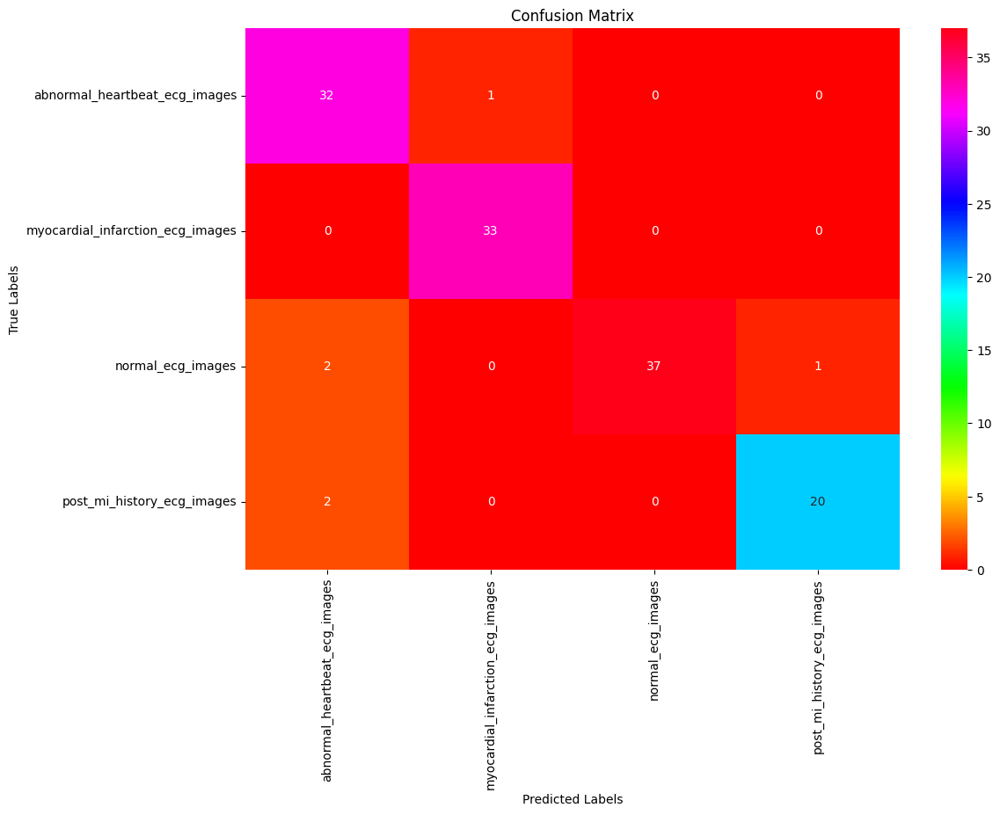

In [19]:
y_true = [class_to_index[label] for _, label in test_data]

y_pred_probs = model.predict(test_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)

y_true = y_true[:len(y_pred)]

class_names = list(class_to_index.keys())

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(12, 8))

sns.heatmap(cm,annot=True,fmt='d',cmap='hsv',xticklabels=class_names,yticklabels=class_names)

plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")

plt.show()

In [20]:
print(classification_report(y_true,y_pred,target_names=class_names))

                                  precision    recall  f1-score   support

   abnormal_heartbeat_ecg_images       0.89      0.97      0.93        33
myocardial_infarction_ecg_images       0.97      1.00      0.99        33
               normal_ecg_images       1.00      0.93      0.96        40
      post_mi_history_ecg_images       0.95      0.91      0.93        22

                        accuracy                           0.95       128
                       macro avg       0.95      0.95      0.95       128
                    weighted avg       0.96      0.95      0.95       128



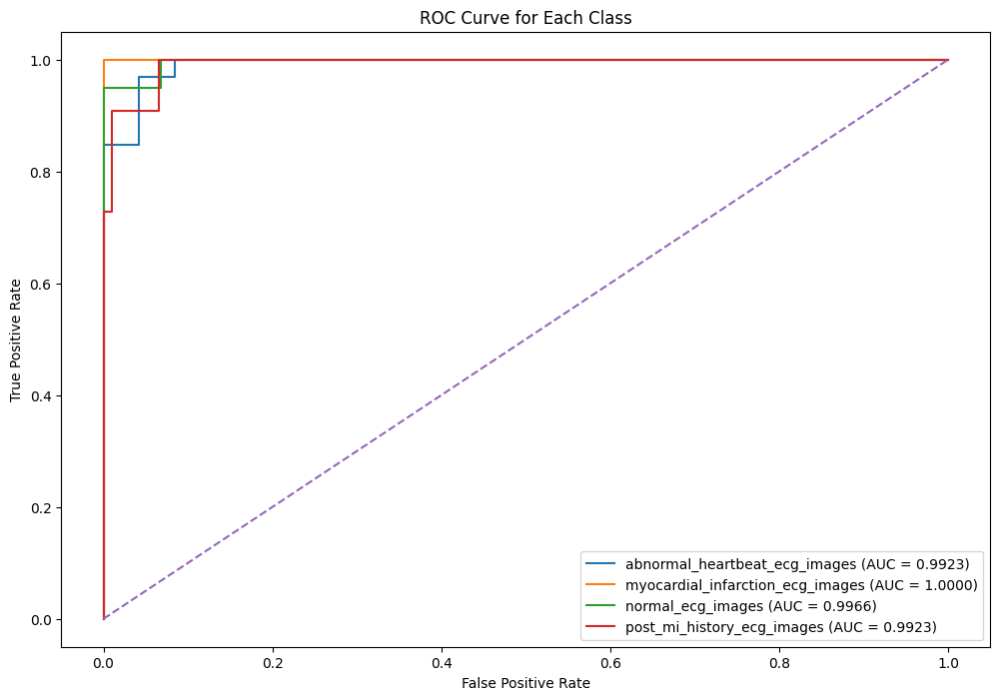

In [21]:
y_true_bin = label_binarize(y_true, classes=range(NUM_CLASSES))

plt.figure(figsize=(12, 8))

for i in range(NUM_CLASSES):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr,tpr,label=f"{class_names[i]} (AUC = {roc_auc:.4f})")

plt.plot([0, 1], [0, 1], linestyle='--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Each Class")
plt.legend(loc="lower right")

plt.show()

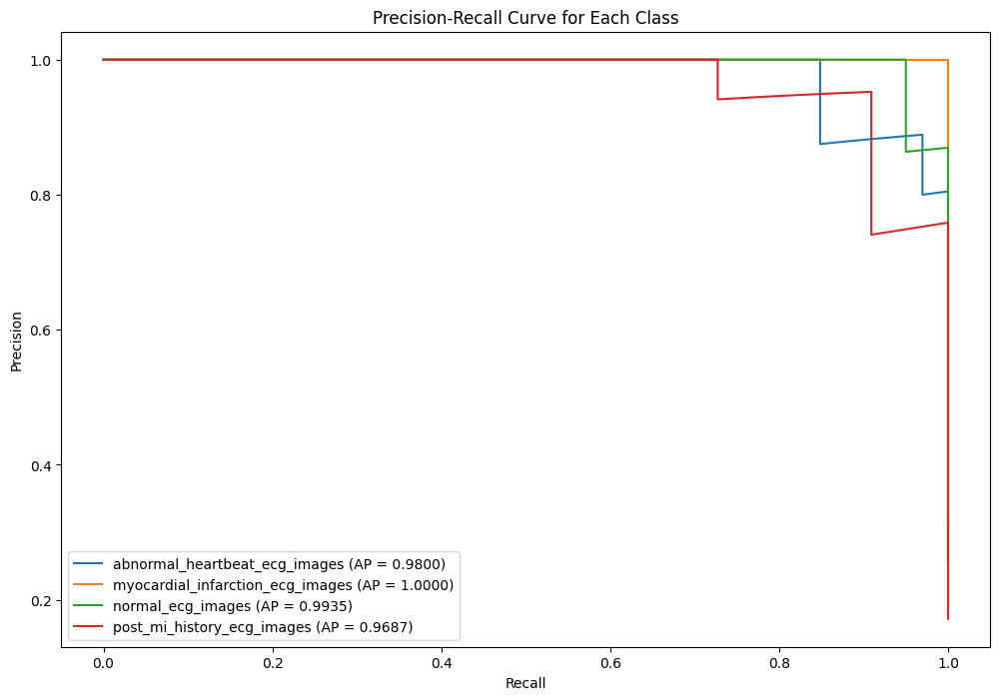

In [22]:
y_true_bin = label_binarize(y_true, classes=range(NUM_CLASSES))

plt.figure(figsize=(12, 8))

for i in range(NUM_CLASSES):
    precision, recall, _ = precision_recall_curve(
        y_true_bin[:, i],
        y_pred_probs[:, i]
    )

    avg_precision = average_precision_score(
        y_true_bin[:, i],
        y_pred_probs[:, i]
    )

    plt.plot(
        recall,
        precision,
        label=f"{class_names[i]} (AP = {avg_precision:.4f})"
    )

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve for Each Class")
plt.legend(loc="lower left")

plt.show()

In [23]:
y_pred = np.argmax(y_pred_probs, axis=1)

acc = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average="weighted")
recall = recall_score(y_true, y_pred, average="weighted")
f1 = f1_score(y_true, y_pred, average="weighted")
mcc = matthews_corrcoef(y_true, y_pred)
kappa = cohen_kappa_score(y_true, y_pred)

y_true_bin = label_binarize(y_true, classes=range(NUM_CLASSES))
roc_auc = roc_auc_score(y_true_bin, y_pred_probs, average="weighted", multi_class="ovr")

print(f"Accuracy        : {acc:.4f}")
print(f"Precision       : {precision:.4f}")
print(f"Recall          : {recall:.4f}")
print(f"F1 Score        : {f1:.4f}")
print(f"ROC AUC Score   : {roc_auc:.4f}")
print(f"Matthews Corr   : {mcc:.4f}")
print(f"Cohen Kappa     : {kappa:.4f}")

Accuracy        : 0.9531
Precision       : 0.9556
Recall          : 0.9531
F1 Score        : 0.9533
ROC AUC Score   : 0.9956
Matthews Corr   : 0.9375
Cohen Kappa     : 0.9367


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


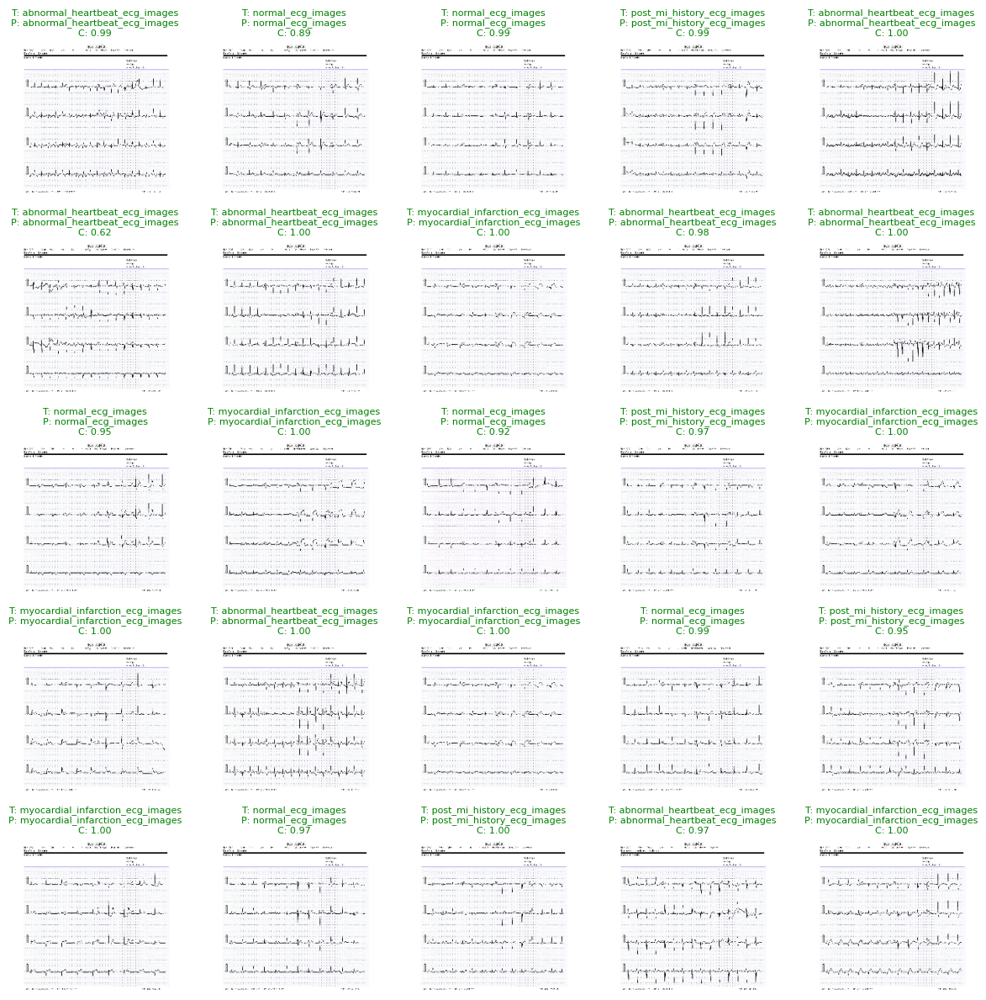

In [24]:
class_names = list(class_to_index.keys())

images, true_labels = test_generator[0]

pred_probs = model.predict(images)
pred_labels = np.argmax(pred_probs, axis=1)
confidences = np.max(pred_probs, axis=1)

plt.figure(figsize=(12, 12))

for i in range(25):
    if i >= len(images):
        break

    plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])

    true_name = class_names[true_labels[i]]
    pred_name = class_names[pred_labels[i]]
    conf = confidences[i]

    color = "green" if true_labels[i] == pred_labels[i] else "red"

    plt.title(f"T: {true_name}\nP: {pred_name}\nC: {conf:.2f}",color=color,fontsize=8)

    plt.axis("off")

plt.tight_layout()
plt.show()

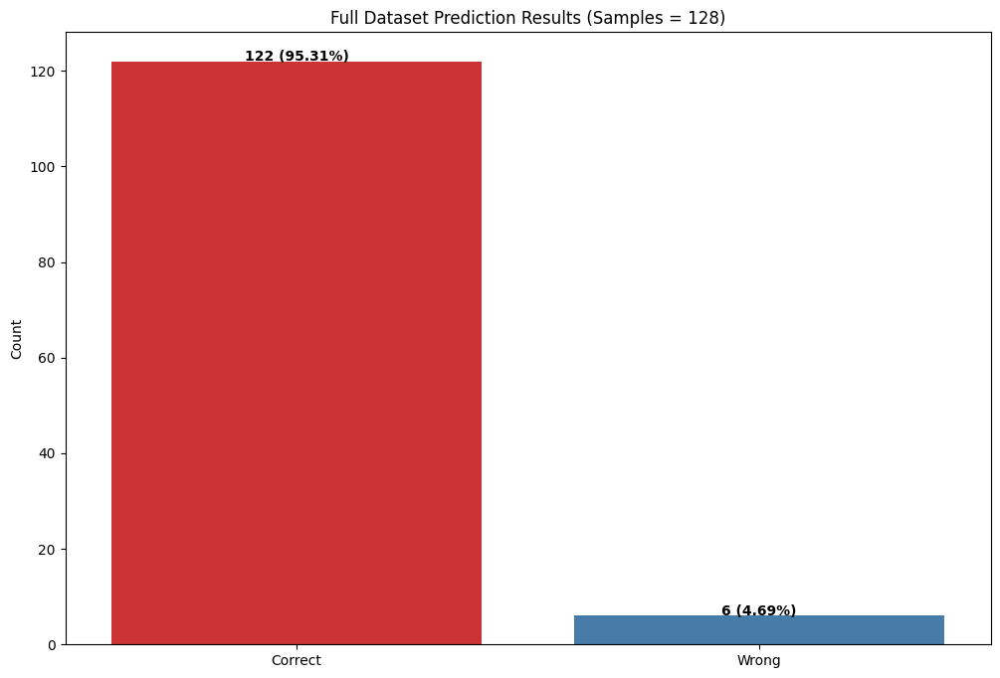

Total Samples: 128
Correct Predictions: 122
Wrong Predictions: 6


In [25]:
y_true = []
y_pred = []

for i in range(len(test_generator)):
    images, labels = test_generator[i]
    
    pred_probs = model.predict(images, verbose=0)
    preds = np.argmax(pred_probs, axis=1)

    y_true.extend(labels)
    y_pred.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

correct = np.sum(y_true == y_pred)
wrong = np.sum(y_true != y_pred)

total = len(y_true)

correct_pct = (correct / total) * 100
wrong_pct = (wrong / total) * 100

labels = ["Correct", "Wrong"]
values = [correct, wrong]
percentages = [correct_pct, wrong_pct]

plt.figure(figsize=(12, 8))

ax = sns.barplot(x=labels, y=values, palette="Set1")

for i, v in enumerate(values):
    plt.text(i,v + 0.1,f"{v} ({percentages[i]:.2f}%)",ha="center",fontweight="bold")

plt.title(f"Full Dataset Prediction Results (Samples = {total})")
plt.ylabel("Count")

plt.show()

print(f"Total Samples: {total}")
print(f"Correct Predictions: {correct}")
print(f"Wrong Predictions: {wrong}")

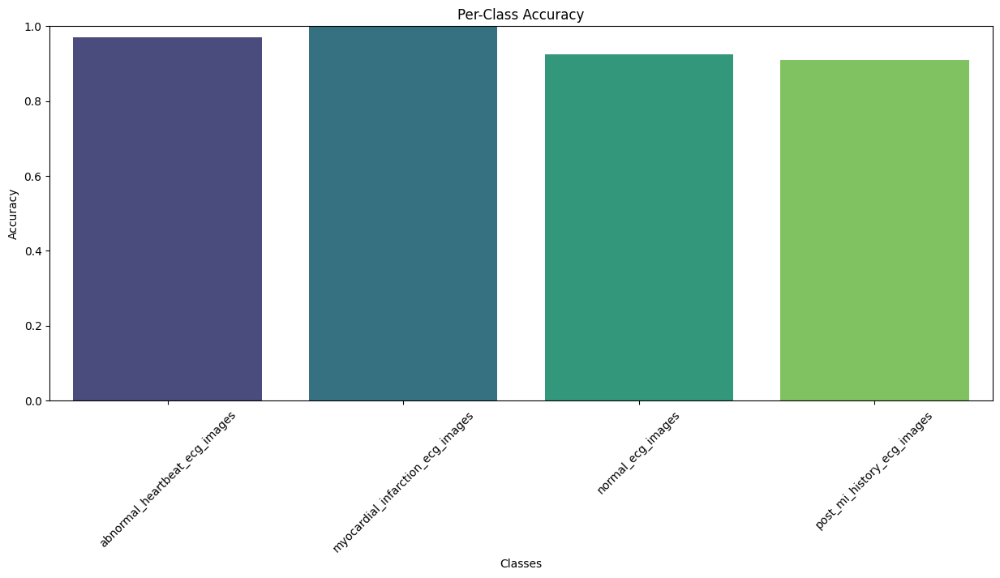

In [26]:
cm = confusion_matrix(y_true, y_pred)

class_acc = cm.diagonal() / cm.sum(axis=1)

plt.figure(figsize=(15, 6))
sns.barplot(x=class_names, y=class_acc, palette="viridis")

plt.title("Per-Class Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Classes")

plt.xticks(rotation=45)
plt.ylim(0, 1)

plt.show()

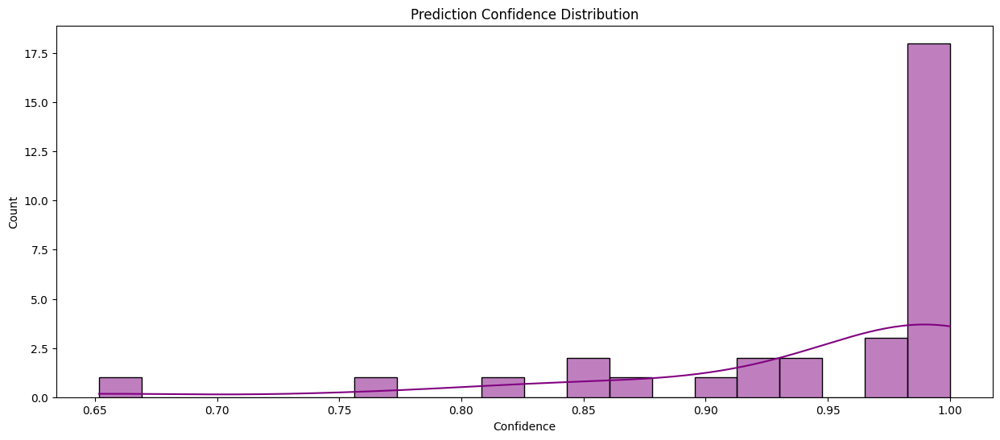

In [27]:
confidences = np.max(pred_probs, axis=1)

plt.figure(figsize=(15, 6))
sns.histplot(confidences, bins=20, kde=True, color="purple")

plt.title("Prediction Confidence Distribution")
plt.xlabel("Confidence")
plt.ylabel("Count")

plt.show()

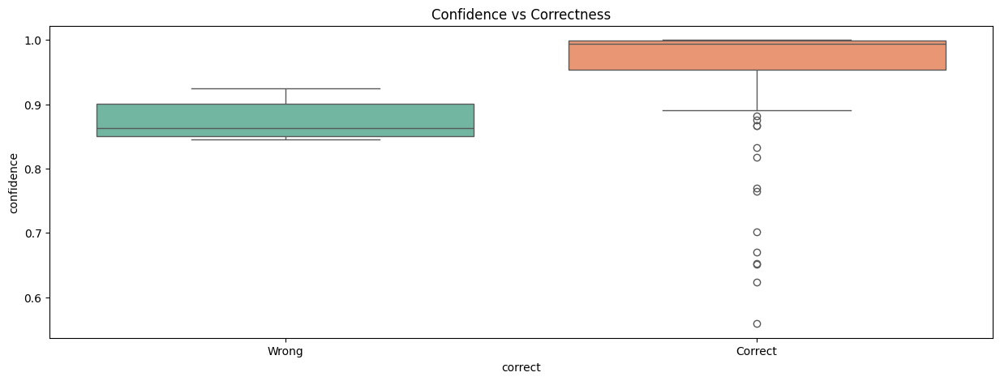

In [28]:
y_true = []
y_pred = []
confidences = []

for i in range(len(test_generator)):
    images, labels = test_generator[i]
    
    probs = model.predict(images, verbose=0)
    preds = np.argmax(probs, axis=1)
    conf = np.max(probs, axis=1)

    y_true.extend(labels)
    y_pred.extend(preds)
    confidences.extend(conf)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
confidences = np.array(confidences)

df = pd.DataFrame({"confidence": confidences,"correct": y_true == y_pred})

plt.figure(figsize=(15, 5))
sns.boxplot(x="correct", y="confidence", data=df, palette="Set2")

plt.xticks([0, 1], ["Wrong", "Correct"])
plt.title("Confidence vs Correctness")

plt.show()

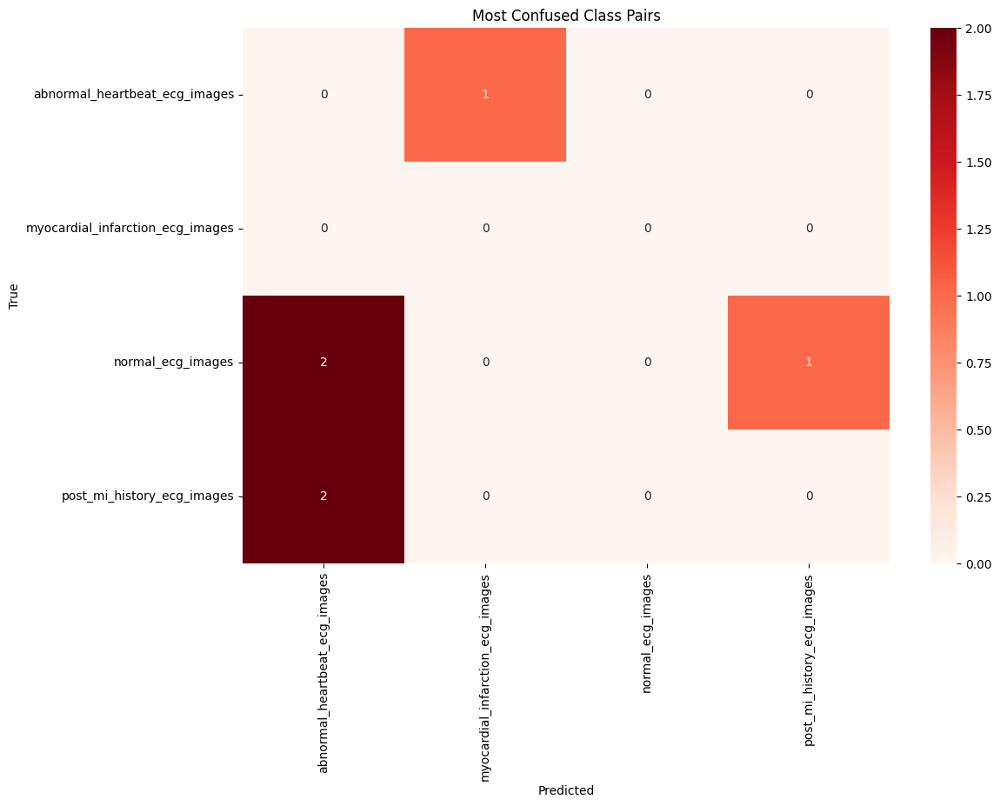

In [29]:
error_cm = cm.copy()
np.fill_diagonal(error_cm, 0)

plt.figure(figsize=(12, 8))
sns.heatmap(error_cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=class_names,
            yticklabels=class_names)

plt.title("Most Confused Class Pairs")
plt.xlabel("Predicted")
plt.ylabel("True")

plt.show()

In [30]:
class_names = list(class_to_index.keys())

def get_last_conv_layer(model):
    for layer in reversed(model.layers):
        if hasattr(layer, 'layers'):
            for sublayer in reversed(layer.layers):
                if isinstance(sublayer, tf.keras.layers.Conv2D):
                    return layer.name, sublayer.name
        if isinstance(layer, tf.keras.layers.Conv2D):
            return None, layer.name
    raise ValueError("No Conv2D layer found")

submodel_name, conv_layer_name = get_last_conv_layer(model)

print(f"Submodel     : {submodel_name}")
print(f"Last Conv2D  : {conv_layer_name}")
print()
print("=" * 60)
print("ALL MODEL LAYERS")
print("=" * 60)
for i, layer in enumerate(model.layers):
    print(f"[{i:3d}] {layer.name:<45} {type(layer).__name__}")

print()
print("=" * 60)
print(f"ALL LAYERS INSIDE SUBMODEL: {submodel_name}")
print("=" * 60)
submodel = model.get_layer(submodel_name)
for i, layer in enumerate(submodel.layers):
    print(f"[{i:3d}] {layer.name:<45} {type(layer).__name__}")

Submodel     : efficientnetv2-b2
Last Conv2D  : top_conv

ALL MODEL LAYERS
[  0] input_layer_1                                 InputLayer
[  1] efficientnetv2-b2                             Functional
[  2] global_average_pooling2d                      GlobalAveragePooling2D
[  3] dropout                                       Dropout
[  4] dense                                         Dense
[  5] dropout_1                                     Dropout
[  6] dense_1                                       Dense
[  7] dropout_2                                     Dropout
[  8] dense_2                                       Dense

ALL LAYERS INSIDE SUBMODEL: efficientnetv2-b2
[  0] input_layer                                   InputLayer
[  1] stem_conv                                     Conv2D
[  2] stem_bn                                       BatchNormalization
[  3] stem_activation                               Activation
[  4] block1a_project_conv                          Conv2D
[  5] bl

In [31]:
submodel = model.get_layer(submodel_name)

inp = model.inputs[0]
conv_out = submodel.get_layer(conv_layer_name).output

intermediate_model = tf.keras.models.Model(inputs=submodel.inputs[0],outputs=[conv_out, submodel.output])

inp_tensor = tf.keras.layers.Input(shape=(224, 224, 3))
conv_output_tensor, submodel_output_tensor = intermediate_model(inp_tensor)
final_output_tensor = model.layers[2](submodel_output_tensor)
final_output_tensor = model.layers[3](final_output_tensor)
final_output_tensor = model.layers[4](final_output_tensor)
final_output_tensor = model.layers[5](final_output_tensor)
final_output_tensor = model.layers[6](final_output_tensor)
final_output_tensor = model.layers[7](final_output_tensor)
final_output_tensor = model.layers[8](final_output_tensor)

grad_model = tf.keras.models.Model(inputs=inp_tensor,outputs=[conv_output_tensor, final_output_tensor])

print("Grad-CAM model rebuilt successfully")
print(f"Input  : {model.inputs[0].shape}")
print(f"Conv output : {grad_model.outputs[0].shape}")
print(f"Final output: {grad_model.outputs[1].shape}")

Grad-CAM model rebuilt successfully
Input  : (None, 224, 224, 3)
Conv output : (None, 7, 7, 1408)
Final output: (None, 4)


In [32]:
def compute_gradcam(img_array, grad_model, pred_label=None):
    img_tensor = tf.cast(img_array, tf.float32)

    with tf.GradientTape() as tape:
        tape.watch(img_tensor)                                    # watch input first
        conv_outputs, predictions = grad_model(img_tensor)
        tape.watch(conv_outputs)                                  # then watch conv
        if pred_label is None:
            pred_label = int(tf.argmax(predictions[0]).numpy())
        loss = predictions[:, pred_label]

    grads = tape.gradient(loss, conv_outputs)

    if grads is None:
        raise ValueError("Gradients are None.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_out     = conv_outputs[0]
    heatmap      = conv_out @ pooled_grads[..., tf.newaxis]
    heatmap      = tf.squeeze(heatmap).numpy()
    heatmap      = np.maximum(heatmap, 0)

    if heatmap.max() > 0:
        heatmap /= heatmap.max()

    confidence = float(tf.reduce_max(predictions).numpy())
    return heatmap, pred_label, confidence


def overlay_heatmap(img_orig_uint8, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    h, w = img_orig_uint8.shape[:2]
    heatmap_resized = cv2.resize(heatmap, (w, h))
    heatmap_uint8   = np.uint8(255 * heatmap_resized)
    heatmap_color   = cv2.applyColorMap(heatmap_uint8, colormap)
    heatmap_rgb     = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

    superimposed = cv2.addWeighted(img_orig_uint8, 1 - alpha, heatmap_rgb, alpha, 0)
    return superimposed, heatmap_rgb

In [33]:
idx = 0
img        = test_generator[0][0][idx]
true_label = int(test_generator[0][1][idx])
img_input  = np.expand_dims(img, axis=0)
img_uint8  = (img * 255).astype(np.uint8)

print(f"img_input shape : {img_input.shape}")
print(f"true_label      : {true_label} → {class_names[true_label]}")

img_input shape : (1, 224, 224, 3)
true_label      : 0 → abnormal_heartbeat_ecg_images


In [34]:
heatmap, pred_label, confidence = compute_gradcam(img_input, grad_model)
superimposed, heatmap_rgb = overlay_heatmap(img_uint8, heatmap)

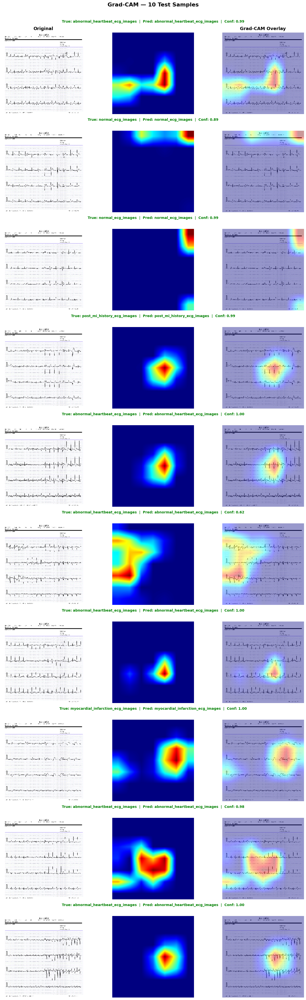

In [35]:
n = 10
fig, axes = plt.subplots(n, 3, figsize=(14, n * 4))
col_titles = ["Original", "Heatmap Only", "Grad-CAM Overlay"]

for idx in range(n):
    img        = test_generator[0][0][idx]
    true_label = int(test_generator[0][1][idx])
    img_input  = np.expand_dims(img, axis=0)
    img_uint8  = (img * 255).astype(np.uint8)

    heatmap, pred_label, confidence = compute_gradcam(img_input, grad_model)
    superimposed, heatmap_rgb = overlay_heatmap(img_uint8, heatmap)

    images = [img_uint8, heatmap_rgb, superimposed]
    color  = "green" if true_label == pred_label else "red"

    for col, (ax, im) in enumerate(zip(axes[idx], images)):
        ax.imshow(im)
        ax.axis("off")

        if idx == 0:
            ax.set_title(col_titles[col], fontsize=13, fontweight="bold", pad=8)

        if col == 1:
            ax.set_title(f"True: {class_names[true_label]}  |  Pred: {class_names[pred_label]}  |  Conf: {confidence:.2f}\n\n", fontsize=10, color=color, fontweight="bold", pad=6)

plt.suptitle("Grad-CAM — 10 Test Samples", fontsize=16, fontweight="bold", y=1.005)
plt.tight_layout()
plt.show()

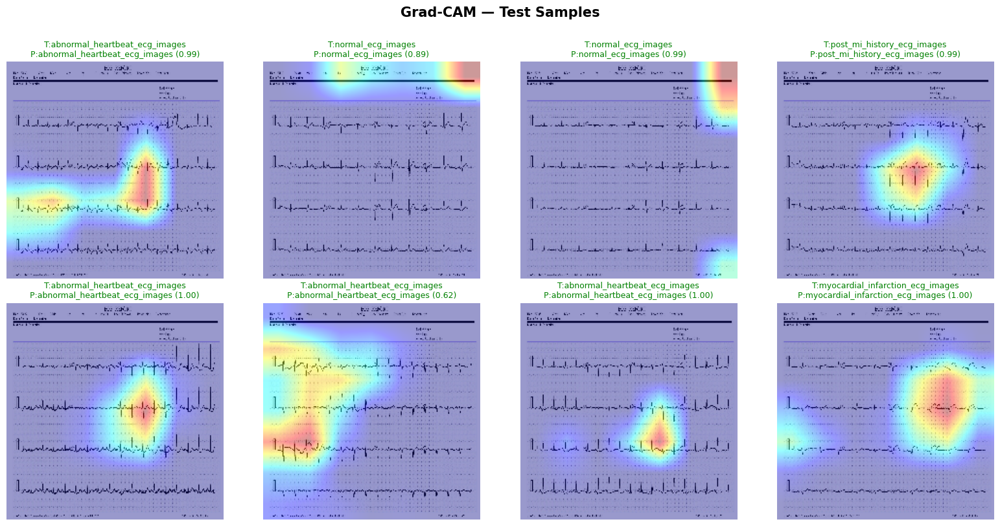

In [36]:
def plot_gradcam_grid(test_generator, grad_model, class_names, n=8, cols=4):
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = axes.flatten()
    count = 0

    for batch_idx in range(len(test_generator)):
        imgs, labels = test_generator[batch_idx]
        for i in range(len(imgs)):
            if count >= n:
                break
            img        = imgs[i]
            true_label = int(labels[i])
            img_input  = np.expand_dims(img, axis=0)
            img_uint8  = (img * 255).astype(np.uint8)

            heatmap, pred_label, confidence = compute_gradcam(img_input, grad_model)
            superimposed, _ = overlay_heatmap(img_uint8, heatmap)

            axes[count].imshow(superimposed)
            axes[count].axis("off")
            color = "green" if true_label == pred_label else "red"
            axes[count].set_title(
                f"T:{class_names[true_label]}\nP:{class_names[pred_label]} ({confidence:.2f})",
                fontsize=9, color=color
            )
            count += 1
        if count >= n:
            break

    for j in range(count, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Grad-CAM — Test Samples", fontsize=15, fontweight="bold", y=1.01)
    plt.tight_layout()
    plt.show()

plot_gradcam_grid(test_generator, grad_model, class_names, n=8, cols=4)

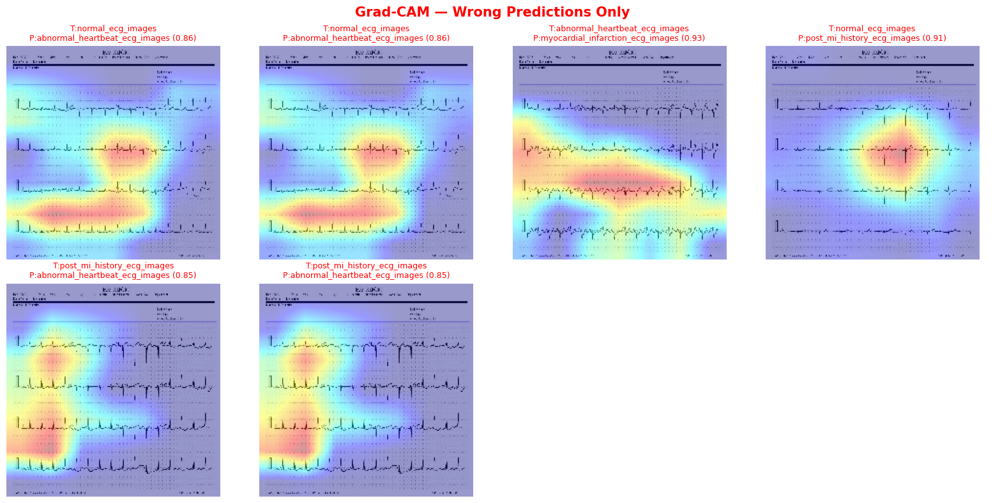

Total wrong shown: 6


In [37]:
def plot_gradcam_wrong(test_generator, grad_model, class_names, n=8, cols=4):
    wrong_imgs, wrong_true, wrong_pred, wrong_conf, wrong_heatmaps = [], [], [], [], []

    for batch_idx in range(len(test_generator)):
        imgs, labels = test_generator[batch_idx]
        for i in range(len(imgs)):
            img        = imgs[i]
            true_label = int(labels[i])
            img_input  = np.expand_dims(img, axis=0)

            heatmap, pred_label, confidence = compute_gradcam(img_input, grad_model)

            if pred_label != true_label:
                wrong_imgs.append((img * 255).astype(np.uint8))
                wrong_true.append(true_label)
                wrong_pred.append(pred_label)
                wrong_conf.append(confidence)
                wrong_heatmaps.append(heatmap)

            if len(wrong_imgs) >= n:
                break
        if len(wrong_imgs) >= n:
            break

    rows = (len(wrong_imgs) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = axes.flatten()

    for idx, (img_u8, tl, pl, conf, hm) in enumerate(
            zip(wrong_imgs, wrong_true, wrong_pred, wrong_conf, wrong_heatmaps)):
        superimposed, _ = overlay_heatmap(img_u8, hm)
        axes[idx].imshow(superimposed)
        axes[idx].axis("off")
        axes[idx].set_title(
            f"T:{class_names[tl]}\nP:{class_names[pl]} ({conf:.2f})",
            fontsize=9, color="red"
        )

    for j in range(len(wrong_imgs), len(axes)):
        axes[j].axis("off")

    plt.suptitle("Grad-CAM — Wrong Predictions Only", fontsize=15, fontweight="bold", color="red")
    plt.tight_layout()
    plt.show()
    print(f"Total wrong shown: {len(wrong_imgs)}")

plot_gradcam_wrong(test_generator, grad_model, class_names, n=8, cols=4)

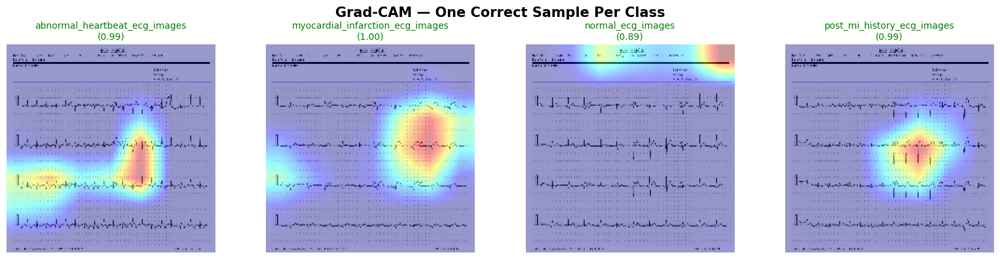

In [38]:
def plot_gradcam_per_class(test_generator, grad_model, class_names, cols=4):
    seen = {}

    for batch_idx in range(len(test_generator)):
        imgs, labels = test_generator[batch_idx]
        for i in range(len(imgs)):
            true_label = int(labels[i])
            if true_label in seen:
                continue
            img_input = np.expand_dims(imgs[i], axis=0)
            heatmap, pred_label, confidence = compute_gradcam(img_input, grad_model)
            if pred_label == true_label:
                seen[true_label] = ((imgs[i] * 255).astype(np.uint8), heatmap, confidence)
        if len(seen) == len(class_names):
            break

    n    = len(seen)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = axes.flatten()

    for idx, cls_idx in enumerate(sorted(seen.keys())):
        img_u8, hm, conf = seen[cls_idx]
        superimposed, _  = overlay_heatmap(img_u8, hm)
        axes[idx].imshow(superimposed)
        axes[idx].axis("off")
        axes[idx].set_title(f"{class_names[cls_idx]}\n({conf:.2f})", fontsize=10, color="green")

    for j in range(n, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Grad-CAM — One Correct Sample Per Class", fontsize=15, fontweight="bold")
    plt.tight_layout()
    plt.show()

plot_gradcam_per_class(test_generator, grad_model, class_names, cols=4)

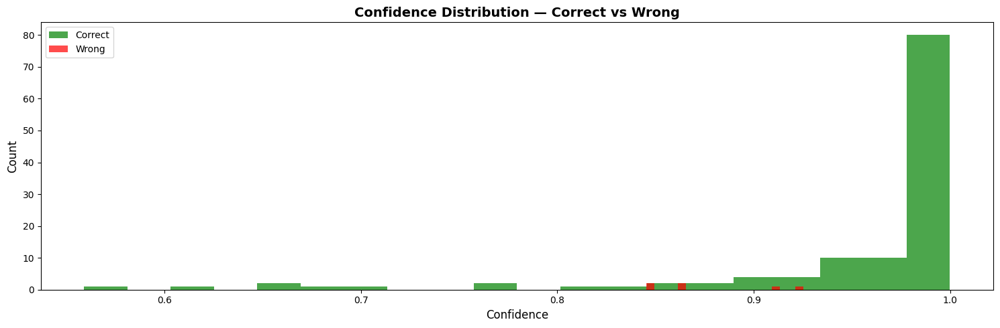

In [39]:
def plot_confidence_distribution(test_generator, grad_model, class_names):
    all_true, all_pred, all_conf = [], [], []

    for batch_idx in range(len(test_generator)):
        imgs, labels = test_generator[batch_idx]
        for i in range(len(imgs)):
            img_input = np.expand_dims(imgs[i], axis=0)
            _, pred_label, confidence = compute_gradcam(img_input, grad_model)
            all_true.append(int(labels[i]))
            all_pred.append(pred_label)
            all_conf.append(confidence)

    all_true = np.array(all_true)
    all_pred = np.array(all_pred)
    all_conf = np.array(all_conf)

    correct = all_conf[all_true == all_pred]
    wrong   = all_conf[all_true != all_pred]

    plt.figure(figsize=(15, 5))
    plt.hist(correct, bins=20, alpha=0.7, color="green", label="Correct")
    plt.hist(wrong,   bins=20, alpha=0.7, color="red",   label="Wrong")
    plt.xlabel("Confidence", fontsize=12)
    plt.ylabel("Count",      fontsize=12)
    plt.title("Confidence Distribution — Correct vs Wrong", fontsize=14, fontweight="bold")
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_confidence_distribution(test_generator, grad_model, class_names)

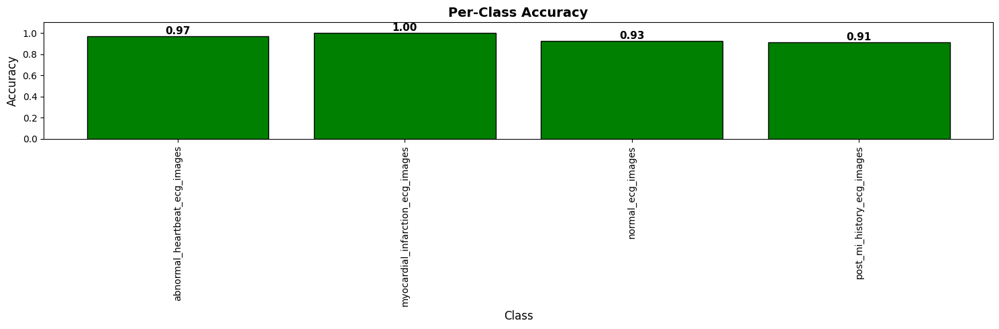

In [40]:
def plot_per_class_accuracy(test_generator, grad_model, class_names):
    correct_count = {i: 0 for i in range(len(class_names))}
    total_count   = {i: 0 for i in range(len(class_names))}

    for batch_idx in range(len(test_generator)):
        imgs, labels = test_generator[batch_idx]
        for i in range(len(imgs)):
            img_input  = np.expand_dims(imgs[i], axis=0)
            _, pred_label, _ = compute_gradcam(img_input, grad_model)
            true_label = int(labels[i])
            total_count[true_label]   += 1
            if pred_label == true_label:
                correct_count[true_label] += 1

    accuracies = [correct_count[i] / total_count[i] if total_count[i] > 0 else 0
                  for i in range(len(class_names))]
    colors = ["green" if a >= 0.7 else "orange" if a >= 0.4 else "red" for a in accuracies]

    plt.figure(figsize=(15, 5))
    bars = plt.bar(class_names, accuracies, color=colors, edgecolor="black")
    for bar, acc in zip(bars, accuracies):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.02,f"{acc:.2f}", ha="center", fontsize=11, fontweight="bold")
    plt.ylim(0, 1.1)
    plt.xlabel("Class",    fontsize=12)
    plt.xticks(rotation=90)
    plt.ylabel("Accuracy", fontsize=12)
    plt.title("Per-Class Accuracy", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

plot_per_class_accuracy(test_generator, grad_model, class_names)

In [ ]:
def predict_and_gradcam(image):
    if image is None:
        return None, None, None, {}

    img = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0

    img_input = np.expand_dims(img, axis=0).astype(np.float32)
    img_uint8 = (img * 255).astype(np.uint8)

    heatmap, pred_label, confidence = compute_gradcam(img_input, grad_model)
    superimposed, heatmap_rgb = overlay_heatmap(img_uint8, heatmap)

    img_tensor   = tf.cast(img_input, tf.float32)
    _, all_probs = grad_model(img_tensor)
    all_probs    = all_probs.numpy()[0]

    probs_dict = {class_names[i]: float(all_probs[i]) for i in range(len(class_names))}

    return superimposed, heatmap_rgb, img_uint8, probs_dict

with gr.Blocks(title="ECG Grad-CAM Inference") as demo:
    gr.Markdown("# ECG Classification with Grad-CAM")
    gr.Markdown("Upload an ECG image to get prediction and Grad-CAM visualization.")

    with gr.Row():
        with gr.Column(scale=1):
            input_image = gr.Image(type="numpy", label="Upload ECG Image")
            run_btn = gr.Button("Run Inference", variant="primary")

        with gr.Column(scale=2):
            with gr.Row():
                out_original = gr.Image(label="Original")
                out_heatmap  = gr.Image(label="Heatmap Only")
                out_overlay  = gr.Image(label="Grad-CAM Overlay")
            out_probs = gr.Label(label="Class Probabilities", num_top_classes=len(class_names))

    run_btn.click(fn=predict_and_gradcam,inputs=input_image,outputs=[out_overlay, out_heatmap, out_original, out_probs])

    gr.Markdown("### How to use\n- Upload an ECG image first\n- Then click **Run Inference**\n- View Grad-CAM overlay and class probabilities")

demo.launch(share=True, debug=True)

* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://659d9bce2831678a68.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
